In [9]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Conv2D, Add, ReLU, Lambda, Conv2DTranspose
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras import losses

In [10]:
# from google.colab import drive
# drive.mount('/content/drive')

In [11]:
TRAIN_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\train\high_res"
TRAIN_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\train\low_res"
VAL_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\val\high_res"
VAL_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\val\low_res"
TEST_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\test\high_res"
TEST_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\test\low_res"

def load_paired_images(lr_dir, hr_dir, lr_size=(128, 128), hr_size=(256, 256)):
    lr_images, hr_images = [], []
    filenames = sorted(os.listdir(lr_dir))

    for filename in filenames:
        lr_path = os.path.join(lr_dir, filename)
        hr_path = os.path.join(hr_dir, filename)

        if os.path.exists(lr_path) and os.path.exists(hr_path):
            lr_img = cv2.imread(lr_path)
            hr_img = cv2.imread(hr_path)

            if lr_img is not None and hr_img is not None:
                lr_img = cv2.resize(cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB), lr_size)
                hr_img = cv2.resize(cv2.cvtColor(hr_img, cv2.COLOR_BGR2RGB), hr_size)

                lr_images.append(lr_img / 255.0)
                hr_images.append(hr_img / 255.0)

    return np.array(lr_images), np.array(hr_images)

lr_train, hr_train = load_paired_images(TRAIN_LR_PATH, TRAIN_HR_PATH, hr_size=(256, 256))
lr_val, hr_val = load_paired_images(VAL_LR_PATH, VAL_HR_PATH, hr_size=(256, 256))
lr_test, hr_test = load_paired_images(TEST_LR_PATH, TEST_HR_PATH, hr_size=(256, 256))

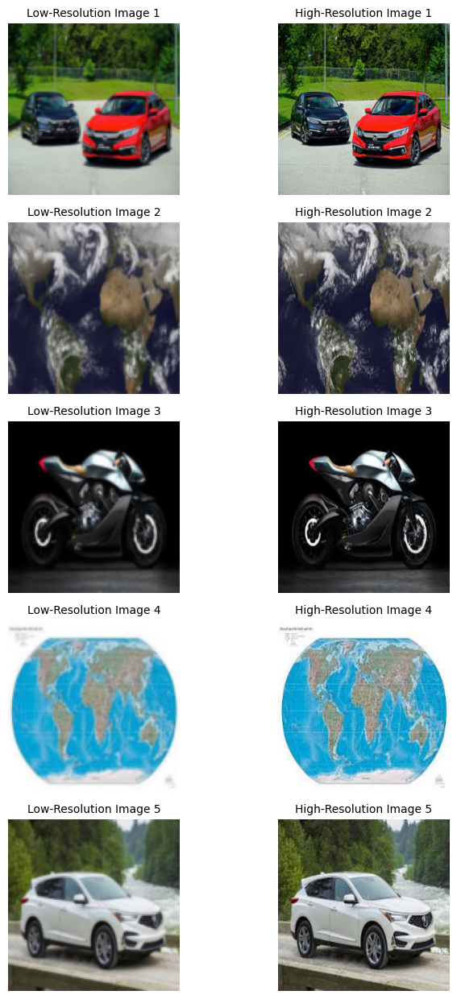

In [12]:
def show_dataset_samples(lr_images, hr_images, n=5):
    plt.figure(figsize=(8, 2.5 * n))
    for i in range(n):
        plt.subplot(n, 2, 2*i + 1)
        plt.imshow(lr_images[i])
        plt.title(f"Low-Resolution Image {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 2, 2*i + 2)
        plt.imshow(hr_images[i])
        plt.title(f"High-Resolution Image {i+1}", fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_dataset_samples(lr_train, hr_train, n=5)

In [13]:
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

def build_fsrcnn():
    inputs = Input(shape=(None, None, 3))
    x = Conv2D(56, (5, 5), activation='relu', padding='same')(inputs)
    x = Conv2D(12, (1, 1), activation='relu', padding='same')(x)
    for _ in range(4):
        x = Conv2D(12, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(56, (1, 1), activation='relu', padding='same')(x)
    x = Conv2DTranspose(3, kernel_size=9, strides=2, padding='same')(x)
    return Model(inputs, x)

model = build_fsrcnn()
model.compile(optimizer='adam', loss='mse', metrics=[psnr, ssim])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, None, None, 56) │         4,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, None, None, 12) │           684 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, None, None, 12) │         1,308 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, None, None, 12) │         1,308 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, None, None, 12) │         1,308 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, None, None, 12) │         1,308 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, None, None, 56) │           728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, None, None, 3)  │        13,611 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,511 (95.75 KB)

 Trainable params: 24,511 (95.75 KB)

 Non-trainable params: 0 (0.00 B)

In [14]:
early_stop = EarlyStopping(monitor='val_psnr', patience=20, mode='max', restore_best_weights=True)
checkpoint = ModelCheckpoint("best_fsrcnn_model.h5", monitor='val_psnr', save_best_only=True, mode='max')

history = model.fit(
    lr_train, hr_train,
    validation_data=(lr_val, hr_val),
    epochs=150,
    batch_size=16,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 610ms/step - loss: 0.1551 - psnr: 10.2494 - ssim: 0.1629

43/43 ━━━━━━━━━━━━━━━━━━━━ 34s 705ms/step - loss: 0.1535 - psnr: 10.3207 - ssim: 0.1650 - val_loss: 0.0233 - val_psnr: 16.9376 - val_ssim: 0.3769
Epoch 2/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 593ms/step - loss: 0.0179 - psnr: 18.2669 - ssim: 0.4693

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 677ms/step - loss: 0.0179 - psnr: 18.2828 - ssim: 0.4704 - val_loss: 0.0154 - val_psnr: 19.4774 - val_ssim: 0.5683
Epoch 3/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 526ms/step - loss: 0.0115 - psnr: 20.4892 - ssim: 0.5740

43/43 ━━━━━━━━━━━━━━━━━━━━ 38s 604ms/step - loss: 0.0115 - psnr: 20.5085 - ssim: 0.5745 - val_loss: 0.0075 - val_psnr: 22.1641 - val_ssim: 0.6273
Epoch 4/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - loss: 0.0062 - psnr: 23.0036 - ssim: 0.6490

43/43 ━━━━━━━━━━━━━━━━━━━━ 43s 638ms/step - loss: 0.0062 - psnr: 23.0067 - ssim: 0.6493 - val_loss: 0.0059 - val_psnr: 23.2392 - val_ssim: 0.6866
Epoch 5/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - loss: 0.0051 - psnr: 23.7324 - ssim: 0.6989

43/43 ━━━━━━━━━━━━━━━━━━━━ 26s 606ms/step - loss: 0.0051 - psnr: 23.7337 - ssim: 0.6991 - val_loss: 0.0053 - val_psnr: 23.7078 - val_ssim: 0.7093
Epoch 6/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - loss: 0.0045 - psnr: 24.3028 - ssim: 0.7275

43/43 ━━━━━━━━━━━━━━━━━━━━ 26s 617ms/step - loss: 0.0045 - psnr: 24.3056 - ssim: 0.7276 - val_loss: 0.0049 - val_psnr: 24.1439 - val_ssim: 0.7310
Epoch 7/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 538ms/step - loss: 0.0041 - psnr: 24.7761 - ssim: 0.7478

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 617ms/step - loss: 0.0041 - psnr: 24.7747 - ssim: 0.7477 - val_loss: 0.0045 - val_psnr: 24.4832 - val_ssim: 0.7420
Epoch 8/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - loss: 0.0039 - psnr: 25.0357 - ssim: 0.7499

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 606ms/step - loss: 0.0039 - psnr: 25.0369 - ssim: 0.7500 - val_loss: 0.0042 - val_psnr: 24.6370 - val_ssim: 0.7554
Epoch 9/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - loss: 0.0037 - psnr: 25.0926 - ssim: 0.7607

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 606ms/step - loss: 0.0037 - psnr: 25.0989 - ssim: 0.7608 - val_loss: 0.0035 - val_psnr: 25.5281 - val_ssim: 0.7672
Epoch 10/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - loss: 0.0032 - psnr: 25.8333 - ssim: 0.7771

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 610ms/step - loss: 0.0032 - psnr: 25.8383 - ssim: 0.7771 - val_loss: 0.0031 - val_psnr: 25.9811 - val_ssim: 0.7783
Epoch 11/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 26s 609ms/step - loss: 0.0028 - psnr: 26.3905 - ssim: 0.7875 - val_loss: 0.0032 - val_psnr: 25.8468 - val_ssim: 0.7859
Epoch 12/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 530ms/step - loss: 0.0028 - psnr: 26.4112 - ssim: 0.7972

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 609ms/step - loss: 0.0028 - psnr: 26.4064 - ssim: 0.7972 - val_loss: 0.0030 - val_psnr: 26.1745 - val_ssim: 0.7918
Epoch 13/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - loss: 0.0028 - psnr: 26.4909 - ssim: 0.7956

43/43 ━━━━━━━━━━━━━━━━━━━━ 26s 607ms/step - loss: 0.0028 - psnr: 26.4972 - ssim: 0.7958 - val_loss: 0.0029 - val_psnr: 26.2409 - val_ssim: 0.8048
Epoch 14/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 526ms/step - loss: 0.0026 - psnr: 26.7637 - ssim: 0.8131

43/43 ━━━━━━━━━━━━━━━━━━━━ 26s 606ms/step - loss: 0.0026 - psnr: 26.7663 - ssim: 0.8131 - val_loss: 0.0026 - val_psnr: 26.9204 - val_ssim: 0.8125
Epoch 15/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - loss: 0.0026 - psnr: 26.8125 - ssim: 0.8123

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 611ms/step - loss: 0.0026 - psnr: 26.8121 - ssim: 0.8124 - val_loss: 0.0025 - val_psnr: 27.0441 - val_ssim: 0.8184
Epoch 16/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 537ms/step - loss: 0.0024 - psnr: 27.1036 - ssim: 0.8241

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 619ms/step - loss: 0.0024 - psnr: 27.1041 - ssim: 0.8241 - val_loss: 0.0024 - val_psnr: 27.3166 - val_ssim: 0.8251
Epoch 17/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 757ms/step - loss: 0.0023 - psnr: 27.2031 - ssim: 0.8266 - val_loss: 0.0025 - val_psnr: 27.0303 - val_ssim: 0.8228
Epoch 18/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 602ms/step - loss: 0.0021 - psnr: 27.6218 - ssim: 0.8336

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 687ms/step - loss: 0.0021 - psnr: 27.6213 - ssim: 0.8336 - val_loss: 0.0023 - val_psnr: 27.4299 - val_ssim: 0.8348
Epoch 19/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 631ms/step - loss: 0.0022 - psnr: 27.5783 - ssim: 0.8410 - val_loss: 0.0027 - val_psnr: 26.5336 - val_ssim: 0.8312
Epoch 20/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/step - loss: 0.0025 - psnr: 26.9292 - ssim: 0.8372

43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 752ms/step - loss: 0.0025 - psnr: 26.9371 - ssim: 0.8373 - val_loss: 0.0022 - val_psnr: 27.5097 - val_ssim: 0.8401
Epoch 21/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0020 - psnr: 27.8006 - ssim: 0.8470

43/43 ━━━━━━━━━━━━━━━━━━━━ 33s 763ms/step - loss: 0.0020 - psnr: 27.8034 - ssim: 0.8470 - val_loss: 0.0020 - val_psnr: 27.9828 - val_ssim: 0.8472
Epoch 22/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 688ms/step - loss: 0.0020 - psnr: 27.9831 - ssim: 0.8520 - val_loss: 0.0021 - val_psnr: 27.9121 - val_ssim: 0.8452
Epoch 23/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 749ms/step - loss: 0.0019 - psnr: 28.1273 - ssim: 0.8546 - val_loss: 0.0025 - val_psnr: 26.7341 - val_ssim: 0.8473
Epoch 24/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 574ms/step - loss: 0.0019 - psnr: 28.0113 - ssim: 0.8533

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 665ms/step - loss: 0.0019 - psnr: 28.0165 - ssim: 0.8534 - val_loss: 0.0019 - val_psnr: 28.2783 - val_ssim: 0.8562
Epoch 25/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 628ms/step - loss: 0.0018 - psnr: 28.3081 - ssim: 0.8607 - val_loss: 0.0021 - val_psnr: 27.6819 - val_ssim: 0.8571
Epoch 26/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 622ms/step - loss: 0.0018 - psnr: 28.3757 - ssim: 0.8603 - val_loss: 0.0022 - val_psnr: 27.5481 - val_ssim: 0.8592
Epoch 27/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - loss: 0.0018 - psnr: 28.4269 - ssim: 0.8660

43/43 ━━━━━━━━━━━━━━━━━━━━ 43s 661ms/step - loss: 0.0018 - psnr: 28.4301 - ssim: 0.8661 - val_loss: 0.0018 - val_psnr: 28.6837 - val_ssim: 0.8646
Epoch 28/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 659ms/step - loss: 0.0016 - psnr: 28.9459 - ssim: 0.8724 - val_loss: 0.0018 - val_psnr: 28.4977 - val_ssim: 0.8627
Epoch 29/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 673ms/step - loss: 0.0017 - psnr: 28.7355 - ssim: 0.8709 - val_loss: 0.0019 - val_psnr: 28.3516 - val_ssim: 0.8680
Epoch 30/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 571ms/step - loss: 0.0016 - psnr: 28.9739 - ssim: 0.8745

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 659ms/step - loss: 0.0016 - psnr: 28.9720 - ssim: 0.8745 - val_loss: 0.0017 - val_psnr: 28.7842 - val_ssim: 0.8711
Epoch 31/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - loss: 0.0016 - psnr: 29.0042 - ssim: 0.8741

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 658ms/step - loss: 0.0016 - psnr: 29.0048 - ssim: 0.8741 - val_loss: 0.0017 - val_psnr: 28.9589 - val_ssim: 0.8727
Epoch 32/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 679ms/step - loss: 0.0017 - psnr: 28.9131 - ssim: 0.8763 - val_loss: 0.0039 - val_psnr: 24.8180 - val_ssim: 0.8363
Epoch 33/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 655ms/step - loss: 0.0027 - psnr: 26.5521 - ssim: 0.8545 - val_loss: 0.0019 - val_psnr: 28.3152 - val_ssim: 0.8633
Epoch 34/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 666ms/step - loss: 0.0016 - psnr: 28.9376 - ssim: 0.8753 - val_loss: 0.0018 - val_psnr: 28.5630 - val_ssim: 0.8723
Epoch 35/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 37s 859ms/step - loss: 0.0017 - psnr: 28.6228 - ssim: 0.8782 - val_loss: 0.0020 - val_psnr: 27.9606 - val_ssim: 0.8693
Epoch 36/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 739ms/step - loss: 0.0017 - psnr: 28.4189 - ssim: 0.8729 - val_loss: 0.0018 - val_psnr: 28.5100 - val_ssim: 0.8760
Epoch 37/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 744ms/step - lo

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 687ms/step - loss: 0.0015 - psnr: 29.1037 - ssim: 0.8827 - val_loss: 0.0016 - val_psnr: 29.0308 - val_ssim: 0.8790
Epoch 39/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - loss: 0.0016 - psnr: 29.0251 - ssim: 0.8808

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 649ms/step - loss: 0.0016 - psnr: 29.0292 - ssim: 0.8809 - val_loss: 0.0016 - val_psnr: 29.1682 - val_ssim: 0.8803
Epoch 40/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - loss: 0.0015 - psnr: 29.5065 - ssim: 0.8846

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 644ms/step - loss: 0.0015 - psnr: 29.5077 - ssim: 0.8846 - val_loss: 0.0016 - val_psnr: 29.1781 - val_ssim: 0.8815
Epoch 41/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 44s 714ms/step - loss: 0.0014 - psnr: 29.6055 - ssim: 0.8843 - val_loss: 0.0019 - val_psnr: 27.9848 - val_ssim: 0.8742
Epoch 42/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 703ms/step - loss: 0.0017 - psnr: 28.5351 - ssim: 0.8805 - val_loss: 0.0021 - val_psnr: 27.4803 - val_ssim: 0.8734
Epoch 43/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 645ms/step - loss: 0.0019 - psnr: 28.0453 - ssim: 0.8827 - val_loss: 0.0017 - val_psnr: 28.8375 - val_ssim: 0.8787
Epoch 44/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 651ms/step - loss: 0.0017 - psnr: 28.5174 - ssim: 0.8812 - val_loss: 0.0016 - val_psnr: 29.0036 - val_ssim: 0.8810
Epoch 45/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - loss: 0.0015 - psnr: 29.2663 - ssim: 0.8857

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 641ms/step - loss: 0.0015 - psnr: 29.2717 - ssim: 0.8857 - val_loss: 0.0015 - val_psnr: 29.2728 - val_ssim: 0.8825
Epoch 46/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - loss: 0.0014 - psnr: 29.5543 - ssim: 0.8864

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 643ms/step - loss: 0.0014 - psnr: 29.5574 - ssim: 0.8865 - val_loss: 0.0015 - val_psnr: 29.4402 - val_ssim: 0.8844
Epoch 47/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 643ms/step - loss: 0.0014 - psnr: 29.5385 - ssim: 0.8902 - val_loss: 0.0017 - val_psnr: 28.7600 - val_ssim: 0.8799
Epoch 48/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 564ms/step - loss: 0.0015 - psnr: 29.4303 - ssim: 0.8890

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 646ms/step - loss: 0.0015 - psnr: 29.4333 - ssim: 0.8890 - val_loss: 0.0015 - val_psnr: 29.4806 - val_ssim: 0.8865
Epoch 49/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - loss: 0.0014 - psnr: 29.7137 - ssim: 0.8864

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 647ms/step - loss: 0.0014 - psnr: 29.7163 - ssim: 0.8865 - val_loss: 0.0015 - val_psnr: 29.5573 - val_ssim: 0.8871
Epoch 50/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 34s 788ms/step - loss: 0.0014 - psnr: 29.5132 - ssim: 0.8888 - val_loss: 0.0021 - val_psnr: 27.4870 - val_ssim: 0.8771
Epoch 51/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 594ms/step - loss: 0.0017 - psnr: 28.7604 - ssim: 0.8844

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 678ms/step - loss: 0.0017 - psnr: 28.7714 - ssim: 0.8845 - val_loss: 0.0014 - val_psnr: 29.6545 - val_ssim: 0.8881
Epoch 52/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 643ms/step - loss: 0.0013 - psnr: 29.8943 - ssim: 0.8920 - val_loss: 0.0020 - val_psnr: 27.6851 - val_ssim: 0.8746
Epoch 53/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 662ms/step - loss: 0.0019 - psnr: 28.0466 - ssim: 0.8832 - val_loss: 0.0015 - val_psnr: 29.4967 - val_ssim: 0.8868
Epoch 54/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 641ms/step - loss: 0.0014 - psnr: 29.5463 - ssim: 0.8893 - val_loss: 0.0015 - val_psnr: 29.6041 - val_ssim: 0.8887
Epoch 55/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 652ms/step - loss: 0.0014 - psnr: 29.5497 - ssim: 0.8908 - val_loss: 0.0017 - val_psnr: 28.7467 - val_ssim: 0.8862
Epoch 56/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 653ms/step - loss: 0.0021 - psnr: 27.7462 - ssim: 0.8840 - val_loss: 0.0020 - val_psnr: 27.7653 - val_ssim: 0.8779
Epoch 57/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 644ms/step - lo

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 641ms/step - loss: 0.0013 - psnr: 30.1544 - ssim: 0.8978 - val_loss: 0.0014 - val_psnr: 29.7888 - val_ssim: 0.8912
Epoch 59/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 635ms/step - loss: 0.0013 - psnr: 30.0437 - ssim: 0.8954 - val_loss: 0.0015 - val_psnr: 29.4339 - val_ssim: 0.8906
Epoch 60/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 633ms/step - loss: 0.0013 - psnr: 29.9270 - ssim: 0.8974 - val_loss: 0.0019 - val_psnr: 28.0402 - val_ssim: 0.8860
Epoch 61/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 648ms/step - loss: 0.0019 - psnr: 28.0152 - ssim: 0.8877 - val_loss: 0.0015 - val_psnr: 29.3074 - val_ssim: 0.8869
Epoch 62/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 641ms/step - loss: 0.0013 - psnr: 29.8062 - ssim: 0.8985 - val_loss: 0.0015 - val_psnr: 29.3705 - val_ssim: 0.8910
Epoch 63/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 630ms/step - loss: 0.0014 - psnr: 29.7220 - ssim: 0.8937 - val_loss: 0.0014 - val_psnr: 29.7173 - val_ssim: 0.8918
Epoch 64/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 632ms/step - lo

43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 650ms/step - loss: 0.0015 - psnr: 29.4006 - ssim: 0.8926 - val_loss: 0.0014 - val_psnr: 29.8478 - val_ssim: 0.8930
Epoch 66/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 677ms/step - loss: 0.0012 - psnr: 30.2779 - ssim: 0.9028 - val_loss: 0.0014 - val_psnr: 29.7359 - val_ssim: 0.8936
Epoch 67/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 694ms/step - loss: 0.0012 - psnr: 30.1814 - ssim: 0.8993

43/43 ━━━━━━━━━━━━━━━━━━━━ 33s 778ms/step - loss: 0.0012 - psnr: 30.1797 - ssim: 0.8993 - val_loss: 0.0013 - val_psnr: 30.0120 - val_ssim: 0.8958
Epoch 68/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 641ms/step - loss: 0.0015 - psnr: 29.1532 - ssim: 0.8941 - val_loss: 0.0018 - val_psnr: 28.4353 - val_ssim: 0.8845
Epoch 69/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 639ms/step - loss: 0.0016 - psnr: 28.9621 - ssim: 0.8922 - val_loss: 0.0015 - val_psnr: 29.1969 - val_ssim: 0.8906
Epoch 70/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 45s 726ms/step - loss: 0.0015 - psnr: 29.2865 - ssim: 0.8966 - val_loss: 0.0014 - val_psnr: 29.5161 - val_ssim: 0.8934
Epoch 71/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 645ms/step - loss: 0.0012 - psnr: 30.0798 - ssim: 0.8990 - val_loss: 0.0014 - val_psnr: 29.7458 - val_ssim: 0.8959
Epoch 72/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 614ms/step - loss: 0.0012 - psnr: 30.2246 - ssim: 0.9025

43/43 ━━━━━━━━━━━━━━━━━━━━ 43s 698ms/step - loss: 0.0012 - psnr: 30.2257 - ssim: 0.9025 - val_loss: 0.0013 - val_psnr: 30.0136 - val_ssim: 0.8972
Epoch 73/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 38s 633ms/step - loss: 0.0012 - psnr: 30.3055 - ssim: 0.9014 - val_loss: 0.0014 - val_psnr: 29.7315 - val_ssim: 0.8946
Epoch 74/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 633ms/step - loss: 0.0014 - psnr: 29.5311 - ssim: 0.8969 - val_loss: 0.0013 - val_psnr: 29.9393 - val_ssim: 0.8960
Epoch 75/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - loss: 0.0012 - psnr: 30.5143 - ssim: 0.9039

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 646ms/step - loss: 0.0012 - psnr: 30.5079 - ssim: 0.9039 - val_loss: 0.0013 - val_psnr: 30.1021 - val_ssim: 0.8980
Epoch 76/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 638ms/step - loss: 0.0012 - psnr: 30.3646 - ssim: 0.9024 - val_loss: 0.0013 - val_psnr: 30.0046 - val_ssim: 0.8979
Epoch 77/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 659ms/step - loss: 0.0012 - psnr: 30.1751 - ssim: 0.9000 - val_loss: 0.0013 - val_psnr: 30.0142 - val_ssim: 0.8978
Epoch 78/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 683ms/step - loss: 0.0013 - psnr: 29.7882 - ssim: 0.8996 - val_loss: 0.0014 - val_psnr: 29.4543 - val_ssim: 0.8952
Epoch 79/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 657ms/step - loss: 0.0013 - psnr: 29.9873 - ssim: 0.9016 - val_loss: 0.0013 - val_psnr: 29.8629 - val_ssim: 0.8953
Epoch 80/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - loss: 0.0013 - psnr: 29.8945 - ssim: 0.9010

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0013 - psnr: 29.8998 - ssim: 0.9010 - val_loss: 0.0013 - val_psnr: 30.1576 - val_ssim: 0.8987
Epoch 81/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 673ms/step - loss: 0.0013 - psnr: 29.7794 - ssim: 0.9018 - val_loss: 0.0016 - val_psnr: 28.9012 - val_ssim: 0.8963
Epoch 82/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 642ms/step - loss: 0.0014 - psnr: 29.3640 - ssim: 0.9006 - val_loss: 0.0020 - val_psnr: 27.7374 - val_ssim: 0.8930
Epoch 83/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 637ms/step - loss: 0.0015 - psnr: 29.0198 - ssim: 0.8985 - val_loss: 0.0015 - val_psnr: 29.2389 - val_ssim: 0.8957
Epoch 84/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 695ms/step - loss: 0.0012 - psnr: 30.0500 - ssim: 0.9032 - val_loss: 0.0016 - val_psnr: 28.7707 - val_ssim: 0.8949
Epoch 85/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 719ms/step - loss: 0.0016 - psnr: 28.8592 - ssim: 0.9014 - val_loss: 0.0014 - val_psnr: 29.5837 - val_ssim: 0.8963
Epoch 86/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - los

43/43 ━━━━━━━━━━━━━━━━━━━━ 26s 608ms/step - loss: 0.0012 - psnr: 30.3133 - ssim: 0.9023 - val_loss: 0.0013 - val_psnr: 30.2773 - val_ssim: 0.9009
Epoch 87/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 47s 741ms/step - loss: 0.0012 - psnr: 30.4672 - ssim: 0.9058 - val_loss: 0.0013 - val_psnr: 30.1996 - val_ssim: 0.9017
Epoch 88/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 704ms/step - loss: 0.0011 - psnr: 30.5685 - ssim: 0.9101 - val_loss: 0.0016 - val_psnr: 28.6392 - val_ssim: 0.8945
Epoch 89/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 678ms/step - loss: 0.0013 - psnr: 29.8370 - ssim: 0.9058 - val_loss: 0.0014 - val_psnr: 29.5614 - val_ssim: 0.8935
Epoch 90/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 652ms/step - loss: 0.0012 - psnr: 30.0909 - ssim: 0.9022 - val_loss: 0.0013 - val_psnr: 30.2499 - val_ssim: 0.8996
Epoch 91/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 671ms/step - loss: 0.0012 - psnr: 30.3566 - ssim: 0.9053 - val_loss: 0.0014 - val_psnr: 29.6156 - val_ssim: 0.9006
Epoch 92/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 670ms/step - lo

43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 698ms/step - loss: 0.0012 - psnr: 30.4092 - ssim: 0.9056 - val_loss: 0.0012 - val_psnr: 30.3008 - val_ssim: 0.9034
Epoch 96/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 678ms/step - loss: 0.0013 - psnr: 29.8172 - ssim: 0.9047 - val_loss: 0.0015 - val_psnr: 29.3370 - val_ssim: 0.8983
Epoch 97/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 653ms/step - loss: 0.0012 - psnr: 30.1464 - ssim: 0.9047 - val_loss: 0.0014 - val_psnr: 29.6489 - val_ssim: 0.9003
Epoch 98/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 711ms/step - loss: 0.0012 - psnr: 30.3169 - ssim: 0.9079 - val_loss: 0.0013 - val_psnr: 29.9149 - val_ssim: 0.9029
Epoch 99/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 690ms/step - loss: 0.0014 - psnr: 29.4370 - ssim: 0.9037 - val_loss: 0.0013 - val_psnr: 30.0328 - val_ssim: 0.9022
Epoch 100/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 611ms/step - loss: 0.0012 - psnr: 30.4837 - ssim: 0.9081

43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 690ms/step - loss: 0.0012 - psnr: 30.4860 - ssim: 0.9081 - val_loss: 0.0012 - val_psnr: 30.4190 - val_ssim: 0.9038
Epoch 101/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 39s 638ms/step - loss: 0.0011 - psnr: 30.6587 - ssim: 0.9090 - val_loss: 0.0012 - val_psnr: 30.3993 - val_ssim: 0.9029
Epoch 102/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 605ms/step - loss: 0.0013 - psnr: 29.8534 - ssim: 0.9054 - val_loss: 0.0016 - val_psnr: 28.5483 - val_ssim: 0.8948
Epoch 103/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 637ms/step - loss: 0.0013 - psnr: 29.8822 - ssim: 0.9072 - val_loss: 0.0013 - val_psnr: 30.1369 - val_ssim: 0.9030
Epoch 104/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - loss: 0.0011 - psnr: 30.7921 - ssim: 0.9098

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 653ms/step - loss: 0.0011 - psnr: 30.7888 - ssim: 0.9098 - val_loss: 0.0012 - val_psnr: 30.4191 - val_ssim: 0.9044
Epoch 105/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 688ms/step - loss: 0.0012 - psnr: 30.1193 - ssim: 0.9072 - val_loss: 0.0013 - val_psnr: 30.0616 - val_ssim: 0.9000
Epoch 106/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0013 - psnr: 29.6198 - ssim: 0.9029 - val_loss: 0.0014 - val_psnr: 29.6736 - val_ssim: 0.8980
Epoch 107/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 644ms/step - loss: 0.0013 - psnr: 30.0267 - ssim: 0.9049 - val_loss: 0.0012 - val_psnr: 30.3160 - val_ssim: 0.9038
Epoch 108/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0011 - psnr: 30.7530 - ssim: 0.9120 - val_loss: 0.0013 - val_psnr: 29.6905 - val_ssim: 0.9007
Epoch 109/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 643ms/step - loss: 0.0011 - psnr: 30.6230 - ssim: 0.9115 - val_loss: 0.0013 - val_psnr: 30.0524 - val_ssim: 0.9024
Epoch 110/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 644ms/ste

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0012 - psnr: 30.2011 - ssim: 0.9070 - val_loss: 0.0012 - val_psnr: 30.4265 - val_ssim: 0.9048
Epoch 115/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 652ms/step - loss: 0.0012 - psnr: 30.4664 - ssim: 0.9105 - val_loss: 0.0015 - val_psnr: 29.1263 - val_ssim: 0.8935
Epoch 116/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 43s 705ms/step - loss: 0.0013 - psnr: 29.8039 - ssim: 0.9062 - val_loss: 0.0012 - val_psnr: 30.1371 - val_ssim: 0.9040
Epoch 117/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 582ms/step - loss: 0.0011 - psnr: 30.7499 - ssim: 0.9100

43/43 ━━━━━━━━━━━━━━━━━━━━ 39s 665ms/step - loss: 0.0011 - psnr: 30.7489 - ssim: 0.9100 - val_loss: 0.0012 - val_psnr: 30.4820 - val_ssim: 0.9057
Epoch 118/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - loss: 0.0011 - psnr: 30.4684 - ssim: 0.9093

43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 646ms/step - loss: 0.0011 - psnr: 30.4731 - ssim: 0.9093 - val_loss: 0.0012 - val_psnr: 30.5157 - val_ssim: 0.9066
Epoch 119/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 672ms/step - loss: 0.0011 - psnr: 30.6357 - ssim: 0.9098 - val_loss: 0.0012 - val_psnr: 30.4869 - val_ssim: 0.9063
Epoch 120/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 662ms/step - loss: 0.0011 - psnr: 30.5210 - ssim: 0.9089 - val_loss: 0.0012 - val_psnr: 30.3538 - val_ssim: 0.9059
Epoch 121/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 643ms/step - loss: 0.0011 - psnr: 30.6028 - ssim: 0.9107 - val_loss: 0.0012 - val_psnr: 30.2652 - val_ssim: 0.9055
Epoch 122/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 643ms/step - loss: 0.0012 - psnr: 30.2379 - ssim: 0.9100 - val_loss: 0.0012 - val_psnr: 30.4013 - val_ssim: 0.9039
Epoch 123/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 45s 723ms/step - loss: 0.0012 - psnr: 30.0603 - ssim: 0.9063 - val_loss: 0.0013 - val_psnr: 29.6491 - val_ssim: 0.9028
Epoch 124/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 38s 645ms/ste

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0012 - psnr: 30.5011 - ssim: 0.9085 - val_loss: 0.0012 - val_psnr: 30.6188 - val_ssim: 0.9073
Epoch 130/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 710ms/step - loss: 0.0011 - psnr: 30.9423 - ssim: 0.9127 - val_loss: 0.0012 - val_psnr: 30.6124 - val_ssim: 0.9075
Epoch 131/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 688ms/step - loss: 0.0011 - psnr: 30.5867 - ssim: 0.9101 - val_loss: 0.0012 - val_psnr: 30.3009 - val_ssim: 0.9059
Epoch 132/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 666ms/step - loss: 0.0011 - psnr: 30.5246 - ssim: 0.9112 - val_loss: 0.0012 - val_psnr: 30.3663 - val_ssim: 0.9058
Epoch 133/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0011 - psnr: 30.5861 - ssim: 0.9121 - val_loss: 0.0014 - val_psnr: 29.3348 - val_ssim: 0.8976
Epoch 134/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 653ms/step - loss: 0.0012 - psnr: 30.1750 - ssim: 0.9103 - val_loss: 0.0012 - val_psnr: 30.5614 - val_ssim: 0.9074
Epoch 135/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 654ms/ste

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 666ms/step - loss: 0.0011 - psnr: 30.4907 - ssim: 0.9084 - val_loss: 0.0011 - val_psnr: 30.6396 - val_ssim: 0.9076
Epoch 150/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 586ms/step - loss: 0.0011 - psnr: 30.9099 - ssim: 0.9104

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 665ms/step - loss: 0.0011 - psnr: 30.9108 - ssim: 0.9105 - val_loss: 0.0011 - val_psnr: 30.6999 - val_ssim: 0.9085


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step


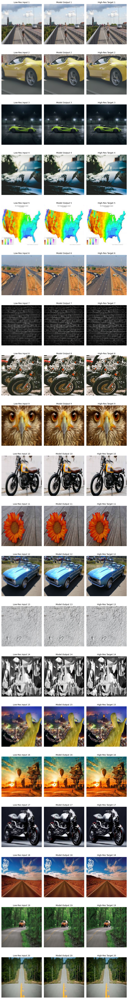

In [15]:
def show_predictions(model, lr_images, hr_images, n=5):
    preds = model.predict(lr_images[:n])
    plt.figure(figsize=(9, 3.5 * n))
    for i in range(n):
        plt.subplot(n, 3, i * 3 + 1)
        plt.imshow(lr_images[i])
        plt.title(f"Low-Res Input {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 3, i * 3 + 2)
        plt.imshow(np.clip(preds[i], 0, 1))
        plt.title(f"Model Output {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 3, i * 3 + 3)
        plt.imshow(hr_images[i])
        plt.title(f"High-Res Target {i+1}", fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_predictions(model, lr_test, hr_test, n=20)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


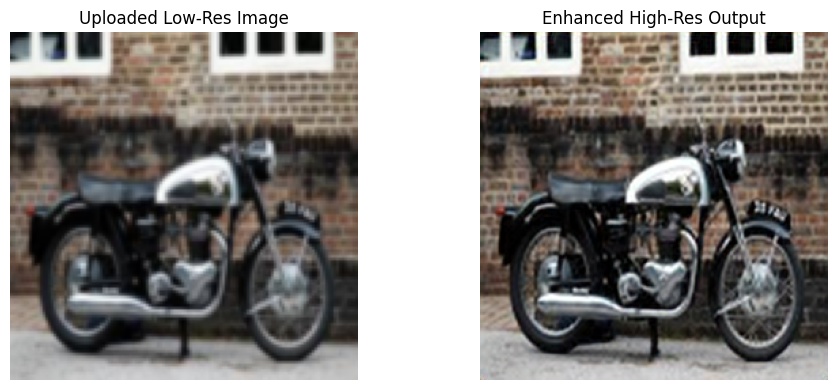

In [24]:
import cv2
from cv2 import dnn_superres
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import os

model_path = r'C:\Users\Yousef\Documents\Image Super Resolution\best_fsrcnn_model.h5'
model = load_model(model_path, compile=False)

image_path = input("Enter the path to the low-resolution image: ").strip()

if not os.path.exists(image_path):
    raise FileNotFoundError(f"File not found: {image_path}")

img = Image.open(image_path).convert("RGB")
img = img.resize((128, 128))  
img_array = np.array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

output = model.predict(img_array)[0]
output = np.clip(output, 0, 1)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(np.squeeze(img_array))
plt.title("Uploaded Low-Res Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(output)
plt.title("Enhanced High-Res Output")
plt.axis("off")

plt.tight_layout()
plt.show()